# Stainlib: Usage example of normalizing with a target image

In [1]:
from pathlib import Path
cwd = Path.cwd()
print(cwd)

K:\Repositories\yuan_ki67\Notebooks


In [2]:
import os
os.chdir(str(cwd.parent))
print(Path.cwd()) # needs to be the parent directory of stainlib in order to import it in the next cell

K:\Repositories\yuan_ki67


In [3]:
import stainlib
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from PIL import Image
from io import BytesIO
from stainlib.utils.plot_utils import _plot_imagegrid
from stainlib.normalization.normalizer import ExtractiveStainNormalizer, ReinhardStainNormalizer
from stainlib.utils.stain_utils import is_uint8_image

import pickle
from pathlib import Path
import tifffile
from tifffile import TiffWriter

In [4]:
pth1 = Path(cwd, 'Template')
print(pth1)
pth2 = Path(cwd, 'Testimages')
print(pth2)
pth3 = Path(cwd, 'Models')
print(pth3)
pth4 = Path(cwd, 'Results')
print(pth4)

K:\Repositories\yuan_ki67\Notebooks\Template
K:\Repositories\yuan_ki67\Notebooks\Testimages
K:\Repositories\yuan_ki67\Notebooks\Models
K:\Repositories\yuan_ki67\Notebooks\Results


In [5]:
template = [x for x in pth1.glob('*.tif')]
templateimages = tifffile.imread(template)
test = [x for x in pth1.glob('*.tif')]  # can also run them on the template
testimages = tifffile.imread(test)

K:\Repositories\yuan_ki67\stainlib\utils\plot_utils.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


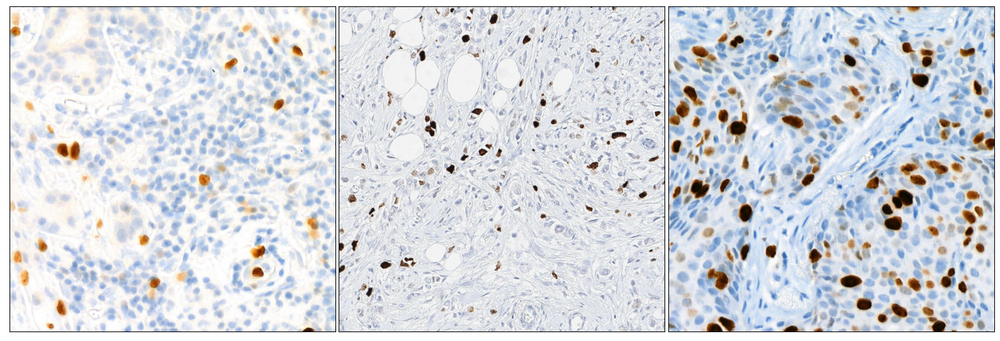

In [6]:
_plot_imagegrid(templateimages, (1,len(templateimages)),figsize=(20,20))

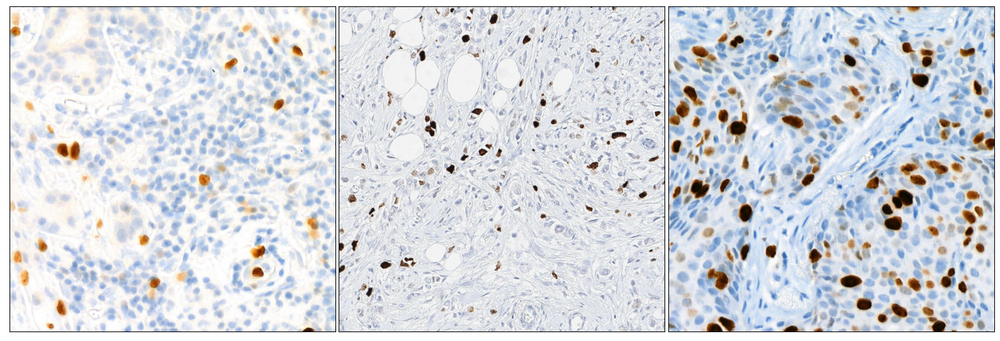

In [7]:
_plot_imagegrid(testimages, (1,3),figsize=(20,20))

In [8]:
target_images = []
source_images = []
titles = []
titles.append("Target Images")
for i in range(len(template)):
    patch_target = tifffile.imread(template[i])
    target_images.append(patch_target)

for i in range(len(test)):
    patch_source = tifffile.imread(test[i])
    source_images.append(patch_source)

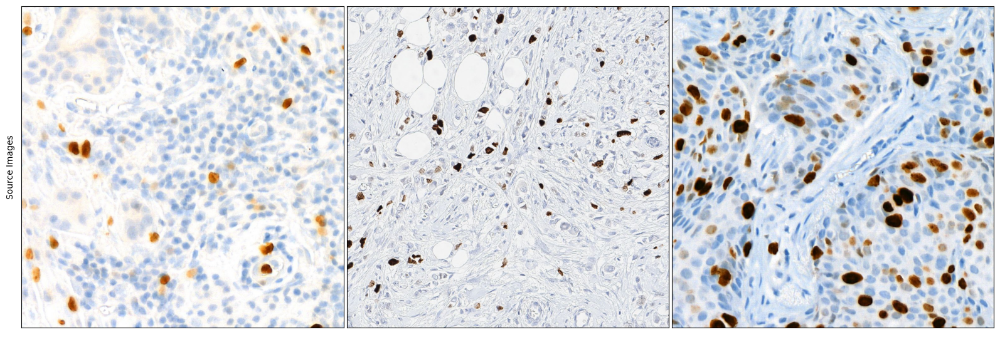

In [9]:
_plot_imagegrid(source_images, (1,len(source_images)),figsize=(20,20), ylabels=["Source Images"] + [None]*5)

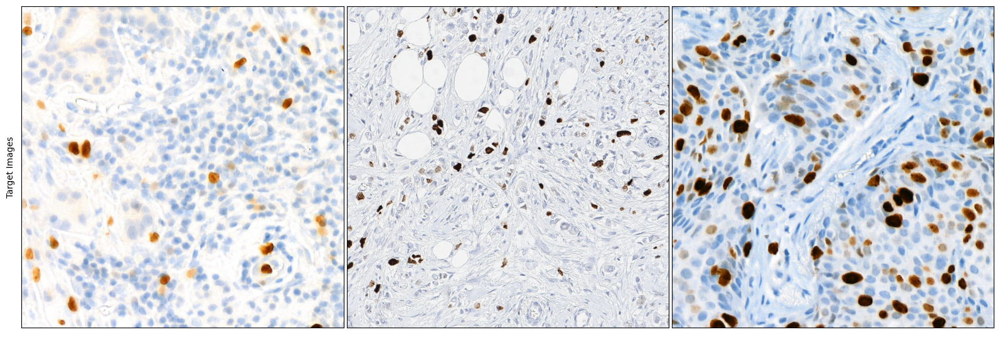

In [10]:
_plot_imagegrid(target_images, (1,len(source_images)),figsize=(20,20), ylabels=["Target Images"] + [None]*5)

## Macenko normalization

In [11]:
# Macenko: will use
normalizer = stainlib.normalization.normalizer.ExtractiveStainNormalizer(method='macenko')
for j in range(len(template)):
    # Standardize brightness (This step is optional but can improve the tissue mask calculation)
    target = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(target_images[j])
    stain_matrix = stainlib.extraction.macenko_stain_extractor.MacenkoStainExtractor.get_stain_matrix(target)
    print(stain_matrix)

[[0.77817027 0.61180606 0.14193087]
 [0.06082507 0.30492058 0.95043346]]
[[0.68772217 0.65179393 0.31969186]
 [0.3539576  0.54978633 0.75660361]]
[[0.81349098 0.57214624 0.10431251]
 [0.1675769  0.3998422  0.90113495]]


In [12]:
normalizer = stainlib.normalization.normalizer.ExtractiveStainNormalizer(method='macenko')
row_transformed = []
for j in range(len(template)):
    # Standardize brightness (This step is optional but can improve the tissue mask calculation)
    target = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(target_images[j])
    row_transformed.append(target)
    normalizer.fit(target)
    # Save model
    model = open(pth3/f"Macenko_v2_{j+1}.pickle", "wb")
    pickle.dump(normalizer, model)
    model.close()

In [13]:
model = open(pth3/f"Macenko_v2_1.pickle", "rb")
normalizer = pickle.load(model)
model.close()
transformed_Macenko = []
for i in range(len(test)):
    # Standardize brightness (This step is optional but can improve the tissue mask calculation)
    to_transform = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(source_images[i])
    slide_tile_matrix = stainlib.extraction.macenko_stain_extractor.MacenkoStainExtractor.get_stain_matrix(to_transform)
    slide_tile_concentrations = stainlib.utils.stain_utils.get_concentrations(to_transform, slide_tile_matrix)
    transformed = normalizer.transform(to_transform, slide_tile_matrix, slide_tile_concentrations)
    transformed_Macenko.append(transformed)

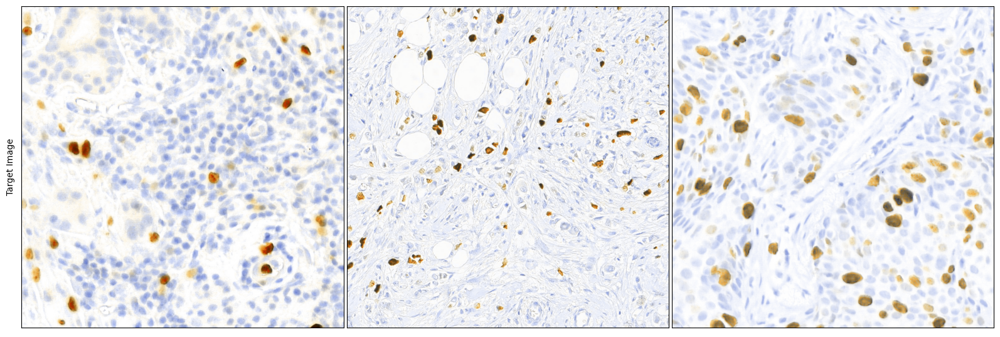

In [14]:
_plot_imagegrid(transformed_Macenko, (1,3),figsize=(20,20), ylabels=["Target Image"] + [None]*5)